In [1]:
import generaluse as gu
import resultsmanaging as rm

import pandas as pd
import cv2
import skimage as ski

%load_ext autoreload
%autoreload 2

In [2]:
folder_name = 'batch03'

dictionary = gu.getImgNamesAndPaths(f"rawdata/{folder_name}")

list_filenames = list(dictionary.keys())
list_filepaths = [*dictionary.values()]

list_data = []
for name, path in zip(list_filenames,list_filepaths):
    data = dict()
    data["Filename"] = name
    data["Filepath"] = path
    list_data.append(data)

dataframe = pd.DataFrame(data=list_data)
dataframe

,Filename,Filepath
0,Experiment-863.jpg,rawdata/batch03/Experiment-863.jpg
1,Experiment-866.jpg,rawdata/batch03/Experiment-866.jpg
2,Experiment-867.jpg,rawdata/batch03/Experiment-867.jpg
3,Experiment-868.jpg,rawdata/batch03/Experiment-868.jpg
4,Experiment-869.jpg,rawdata/batch03/Experiment-869.jpg
5,Experiment-870.jpg,rawdata/batch03/Experiment-870.jpg
6,Experiment-871.jpg,rawdata/batch03/Experiment-871.jpg


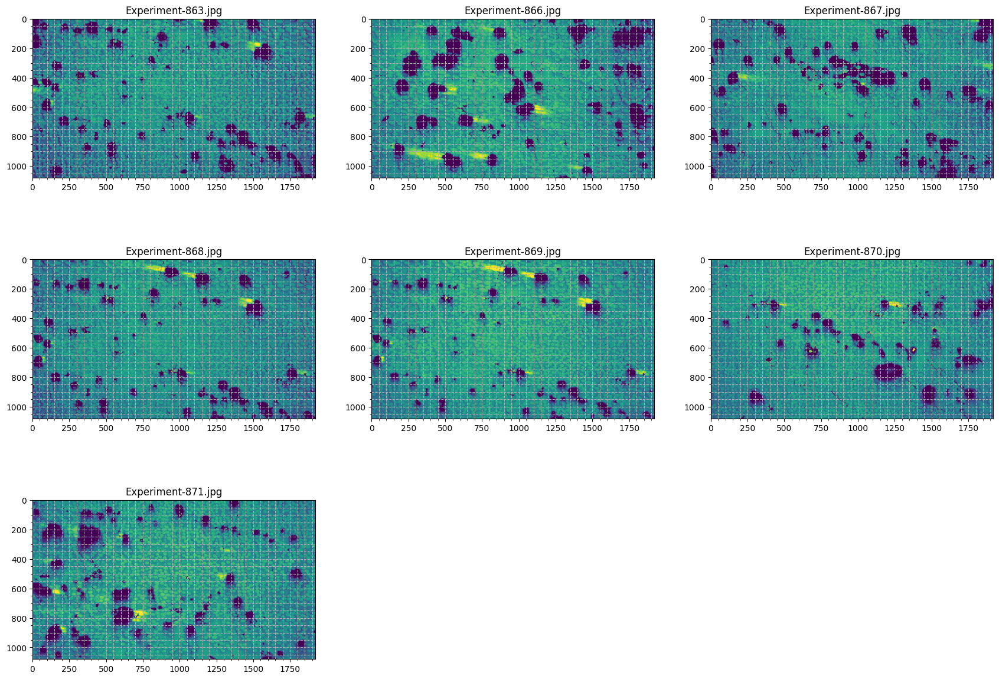

In [3]:
list_imgs = gu.getImagesFromPathfile(list_filepaths,cv2.COLOR_BGR2GRAY)
gu.plotFigures(list_filenames,list_imgs)

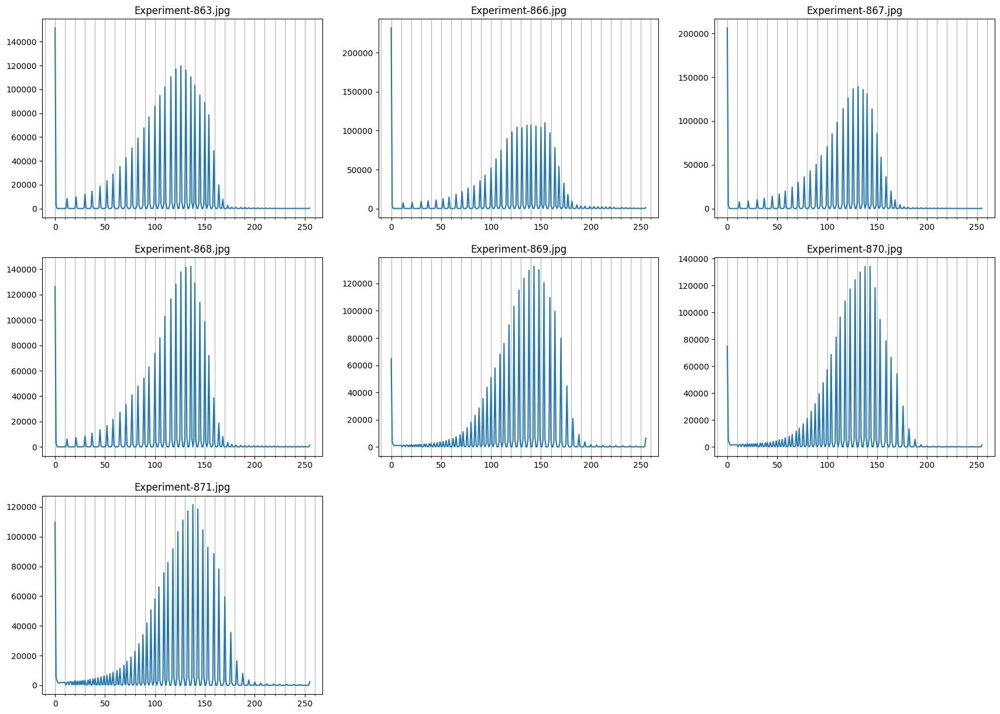

In [4]:
list_hist = []
for img in list_imgs:

    hist = cv2.calcHist([img], [0], None, [256], [0, 256])
    list_hist.append(hist)

gu.plotHist(list_filenames,list_hist)

In [5]:
import imgproc as ip
import matplotlib.pyplot as plt
import numpy as np

In [6]:
histogram_of_picture = np.array([np.uint32(value[0]) for value in list_hist[0]])

maximum = np.max(histogram_of_picture[20:])

index_maximum = np.where(histogram_of_picture[20:] == maximum)[0][0]

print(maximum)

print(index_maximum)

119735
106


In [7]:
img_selected = list_imgs[0]

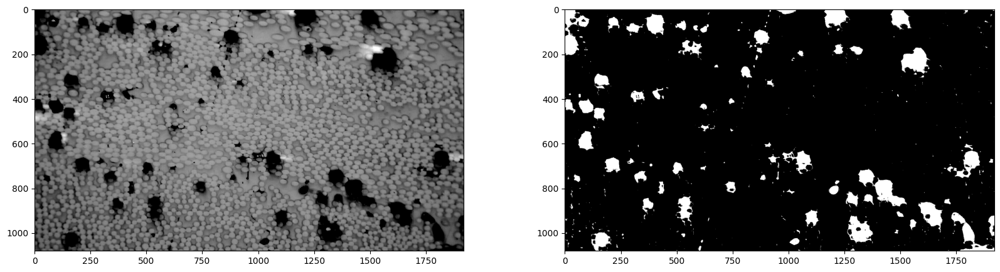

In [8]:
test_1 = ip.getDegradedFiberWithBubbles(img_selected,20)

fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(test_1,cmap='gray',vmin=0,vmax=255)

plt.show()

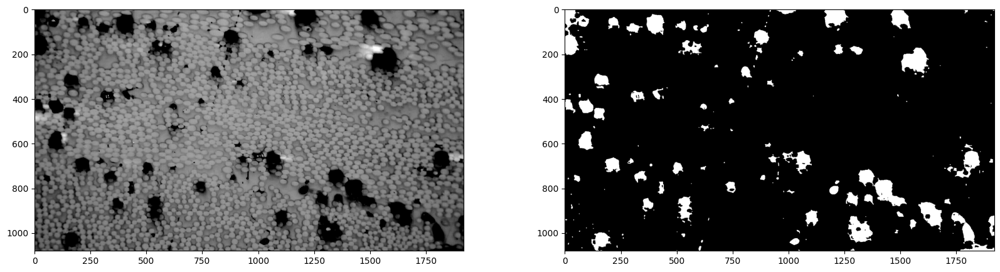

In [9]:
test_2 = ip.applyOpening(test_1,3)

fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(test_2,cmap='gray',vmin=0,vmax=255)

plt.show()

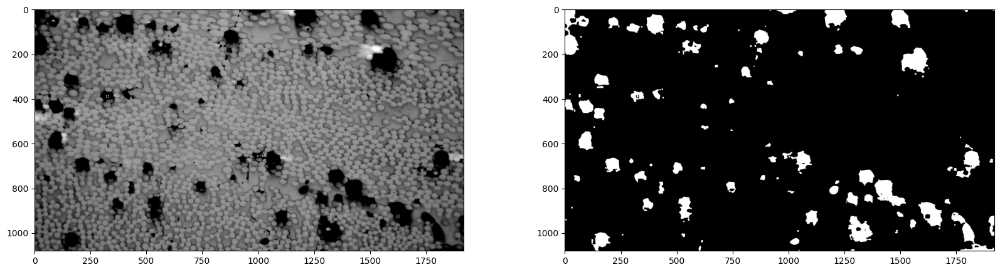

In [10]:
test_3 = ip.applyOpening(test_2,5)

fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(test_3,cmap='gray',vmin=0,vmax=255)

plt.show()

In [11]:
contours, hierarchy = cv2.findContours(image=test_3, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of contours: {len(contours)}")

print(type(contours))

Number of contours: 124
<class 'tuple'>


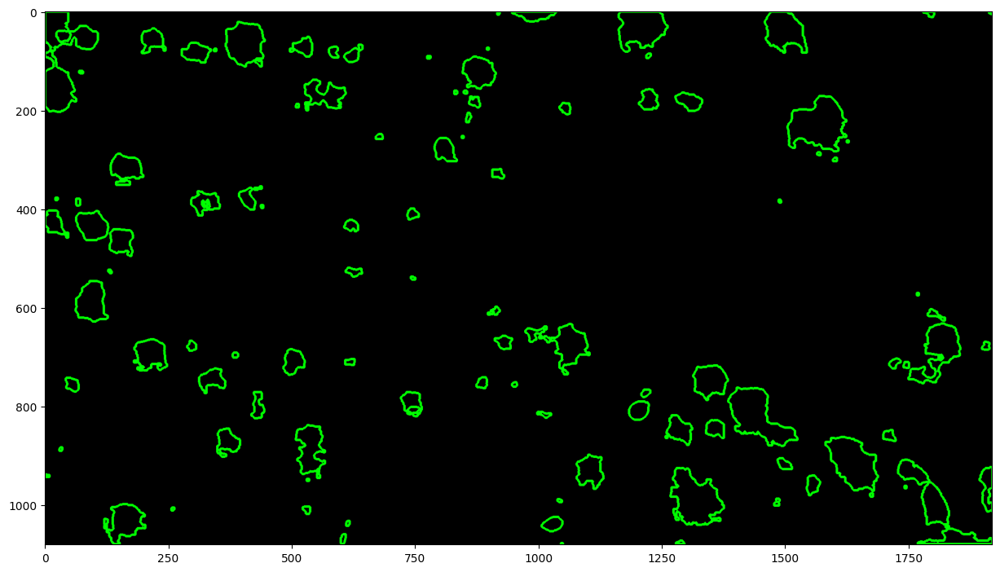

In [12]:
dim = np.shape(test_3)

img_contornos = cv2.drawContours(np.zeros((dim[0],dim[1],3)), contours, -1, (0,255,0), 3)
img_contornos = np.uint8(img_contornos)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(img_contornos,vmin=0,vmax=255)
plt.show()

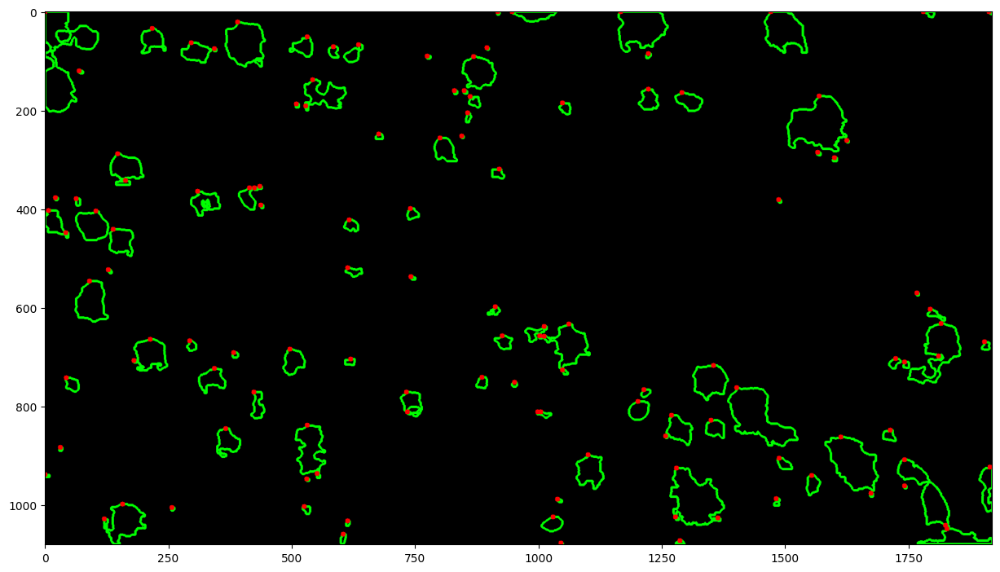

In [13]:
first_element_of_contours = np.array([np.uint32(contours[i][0][0]) for i in range(len(contours))])
img_points = img_contornos.copy()

for p in first_element_of_contours:
    cv2.circle(img_points, (p[0],p[1]), 5, (255,0,0), -1)


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(img_points,vmin=0,vmax=255)
plt.show()

In [14]:
print(first_element_of_contours[0:2])

list_coordinates = [(np.uint16(p[1]),np.uint16(p[0])) for p in first_element_of_contours]
print(list_coordinates[0:2])

[[1045 1077]
 [1286 1072]]
[(1077, 1045), (1072, 1286)]


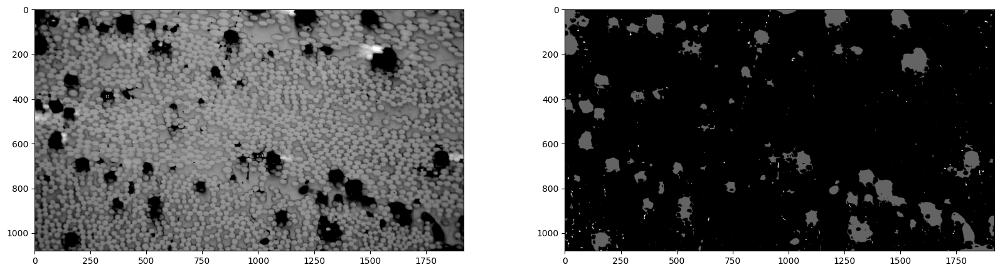

In [15]:
from skimage.segmentation import flood

image_flooded = test_1.copy()
list_masks = []

for coordinate in list_coordinates:
    mask = flood(test_1, coordinate, tolerance=1)
    list_masks.append(mask)
    image_flooded[mask] = 100

fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(image_flooded,cmap='gray',vmin=0,vmax=255)

plt.show()

In [16]:
# clahe = cv2.createCLAHE(clipLimit=2,tileGridSize=(10, 10))
# clahe_img = clahe.apply(img_selected)

# clahe_img = clahe.apply(img_selected)

# t0, t1, t2, t3 = ski.filters.threshold_multiotsu(clahe_img, classes=5)

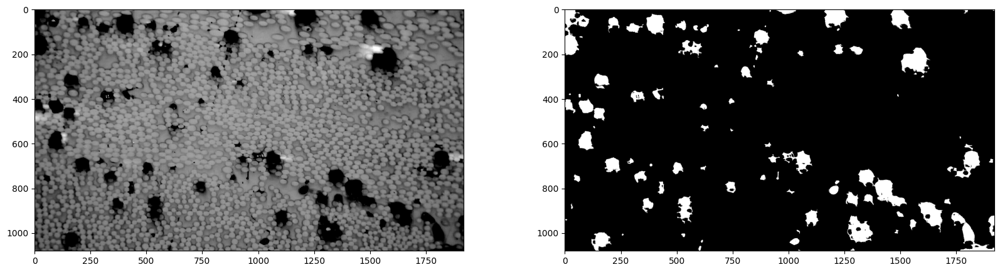

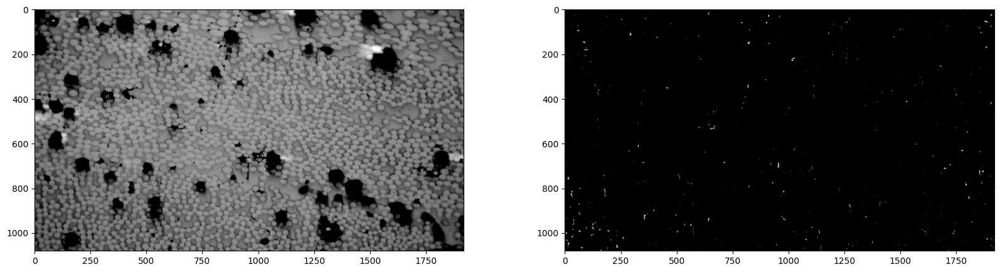

In [16]:
bubbles = np.zeros(np.shape(img_selected),dtype=np.uint8)
for mask in list_masks:
    bubbles[mask] = 255

others = test_1.copy()
others[bubbles == 255] = 0


fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(bubbles,cmap='gray',vmin=0,vmax=255)

plt.show()

fig = plt.figure(figsize=(20,5))

ax = fig.add_subplot(1, 2, 1)
ax.imshow(img_selected,cmap='gray',vmin=0,vmax=255)

ax = fig.add_subplot(1, 2, 2)
ax.imshow(others,cmap='gray',vmin=0,vmax=255)

plt.show()

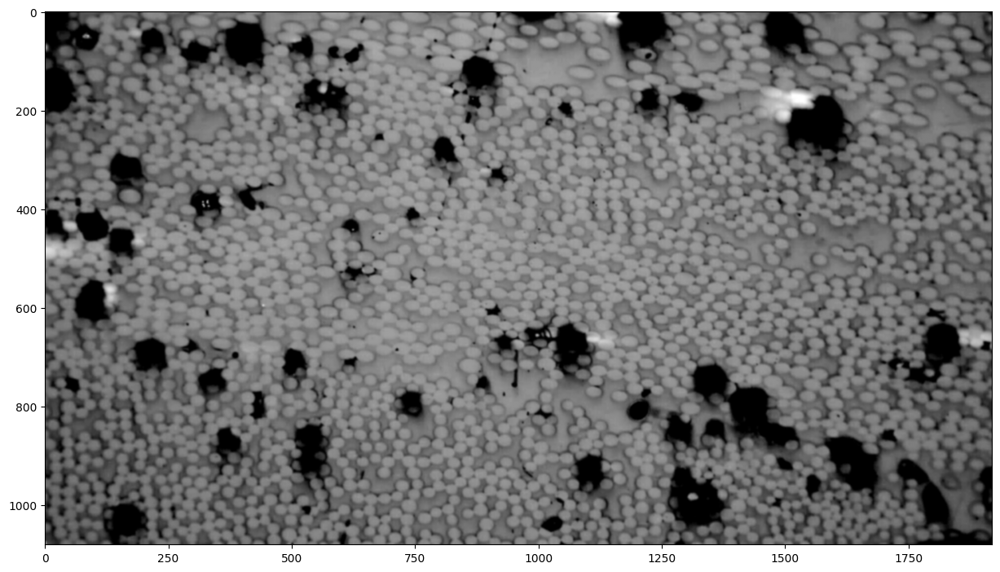

In [17]:
test_4 = cv2.GaussianBlur(img_selected, (7, 7), 0)

fig = plt.figure(figsize=(15,15))
plt.imshow(test_4,cmap='gray',vmin=0,vmax=255)
plt.show()

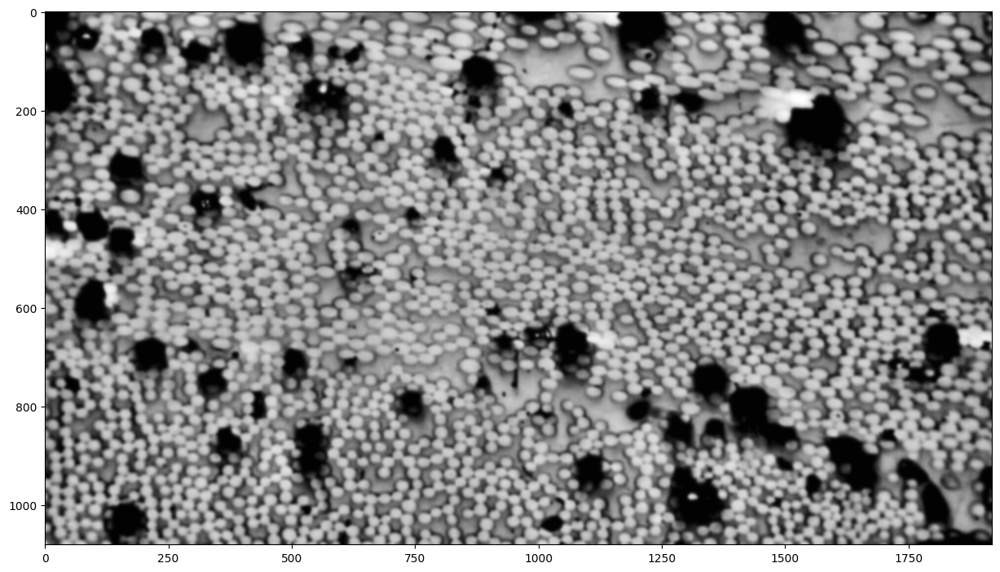

[ 43  94 134 172]


In [305]:
clahe = cv2.createCLAHE(clipLimit=2,tileGridSize=(10, 10))
test_5 = cv2.GaussianBlur(clahe.apply(test_4), (11, 11), 0)

fig = plt.figure(figsize=(15,15))
plt.imshow(test_5,cmap='gray',vmin=0,vmax=255)
plt.show()

list_ts = ski.filters.threshold_multiotsu(test_5, classes=5)
print(list_ts)

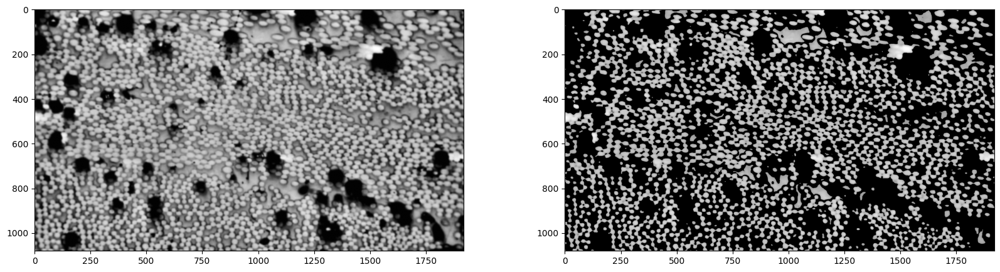

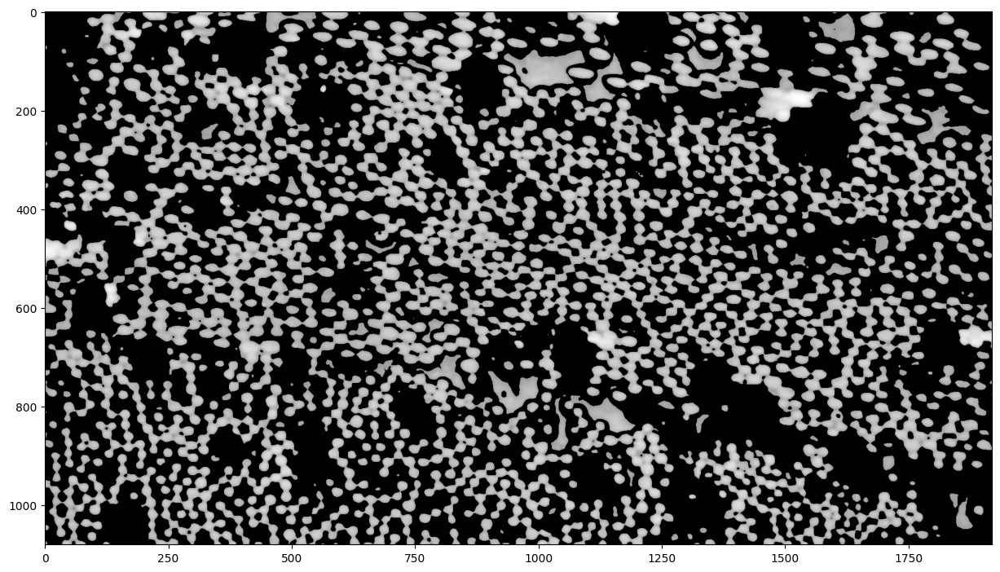

In [382]:
thresh_1 = np.zeros(np.shape(test_5),dtype=np.uint8)

thresh_1[test_5 > np.mean(list_ts[2:])] = 255 #np.mean(list_ts[2:])

test_6 = test_5.copy()
test_6[~(thresh_1 == 255)] = 0

fig = plt.figure(figsize=(20,5))
ax = fig.add_subplot(1, 2, 1)
ax.imshow(test_5,cmap='gray',vmin=0,vmax=255)
ax = fig.add_subplot(1, 2, 2)
ax.imshow(test_6,cmap='gray',vmin=0,vmax=255)
plt.show()

fig = plt.figure(figsize=(15,15))
plt.imshow(test_6,cmap='gray',vmin=0,vmax=255)
plt.show()

In [383]:
list_ts_test_6 = ski.filters.threshold_multiotsu(test_6, classes=5)
print(list_ts_test_6)

[  1 169 185 201]


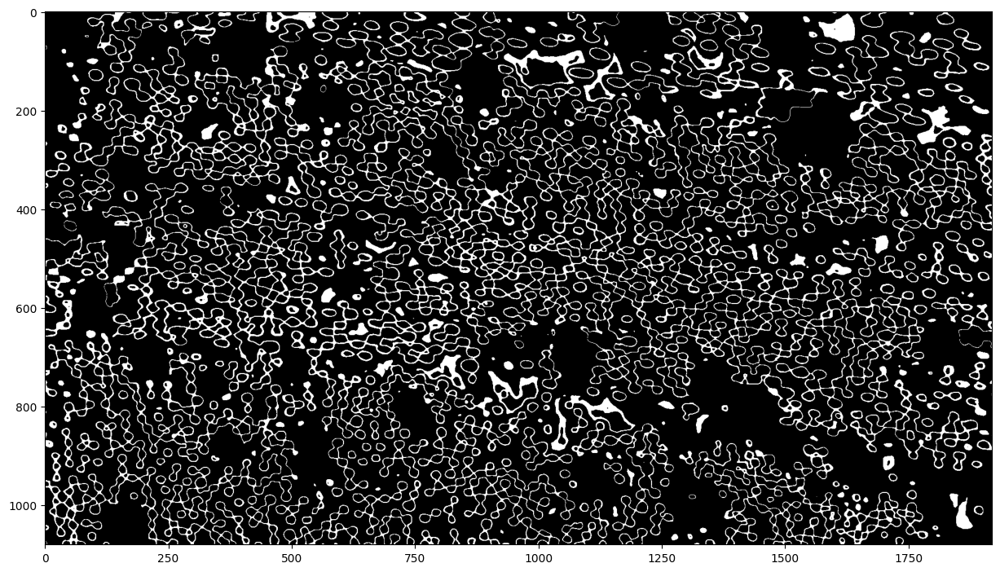

In [384]:
test_7 = test_6.copy()
test_7[(test_6>np.mean(list_ts_test_6[1:3]))] = 0 #(test_6<list_ts_test_6[1]) | #np.mean(list_ts_test_6[1:3]

#test_7[(test_6<np.mean(list_ts_test_6[0:2])) | (test_6>np.mean(list_ts_test_6[1:3]))] = 0

test_7[test_7 != 0] = 255

fig = plt.figure(figsize=(15,15))
plt.imshow(test_7,cmap='gray',vmin=0,vmax=255)
plt.show()

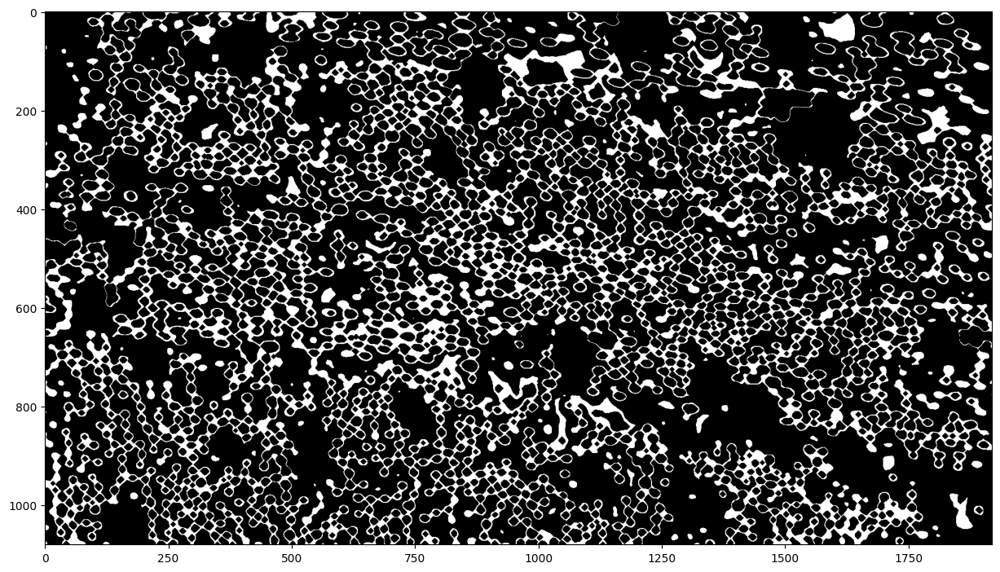

In [385]:
kernel = np.array([[0,1,0],
                   [1,1,1],
                   [0,1,0]],dtype=np.uint8)

test_7_op = cv2.morphologyEx(test_7, cv2.MORPH_CLOSE, kernel, iterations=5)

fig = plt.figure(figsize=(15,15))
plt.imshow(test_7_op,cmap='gray',vmin=0,vmax=255)
plt.show()

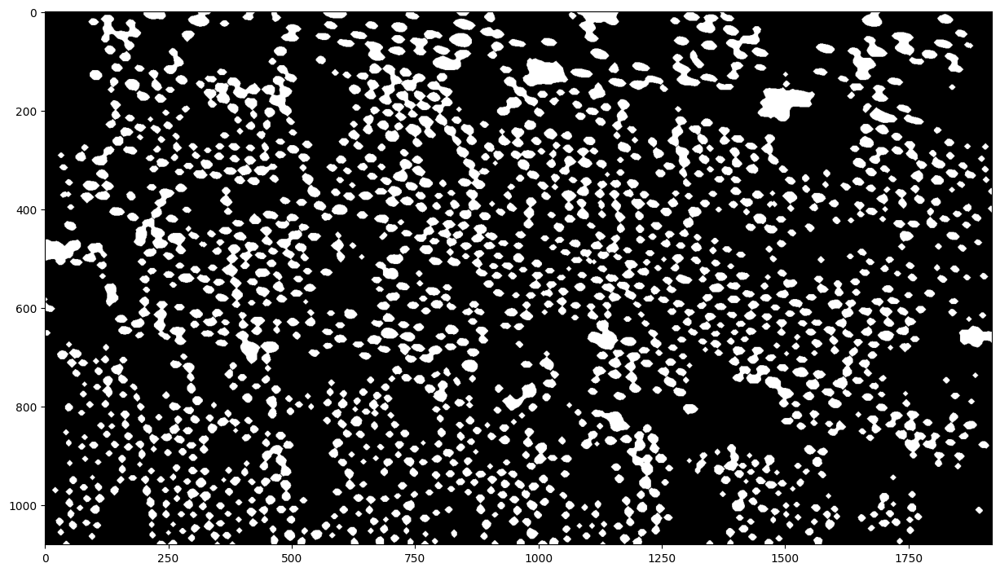

In [386]:
test_8 = np.int16(test_6) - np.int16(test_7_op)
test_8[test_8 < 0] = 0
test_8[test_8 > 255] = 255
test_8[test_8 != 0] = 255
test_8 = np.uint8(test_8)

fig = plt.figure(figsize=(15,15))
plt.imshow(test_8,cmap='gray',vmin=0,vmax=255)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..255.0].


Number of contours: 1378


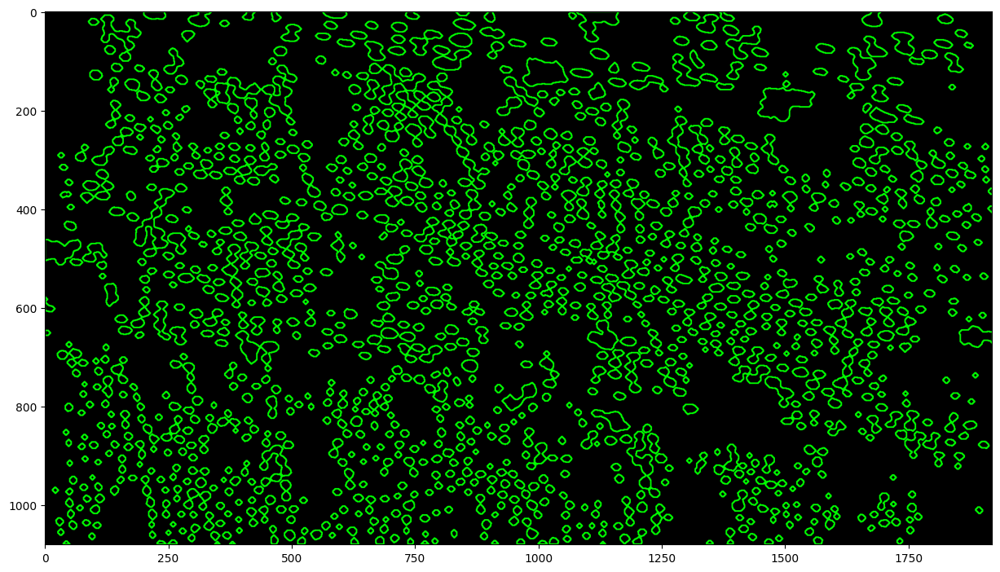

In [387]:
contours_fibers, hierarchy_fibers = cv2.findContours(image=test_8, mode=cv2.RETR_EXTERNAL, method=cv2.CHAIN_APPROX_SIMPLE)

print(f"Number of contours: {len(contours_fibers)}")

dim = np.shape(test_8)

img_contornos_2 = cv2.drawContours(np.zeros((dim[0],dim[1],3)), contours_fibers, -1, (0,255,0), 2)
img_contornos_3 = np.uint8(img_contornos_2)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(img_contornos_2,vmin=0,vmax=255)
plt.show()

17.61320754716981
15.272437385791859


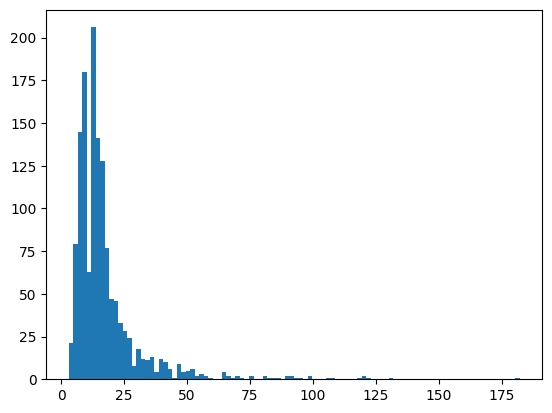

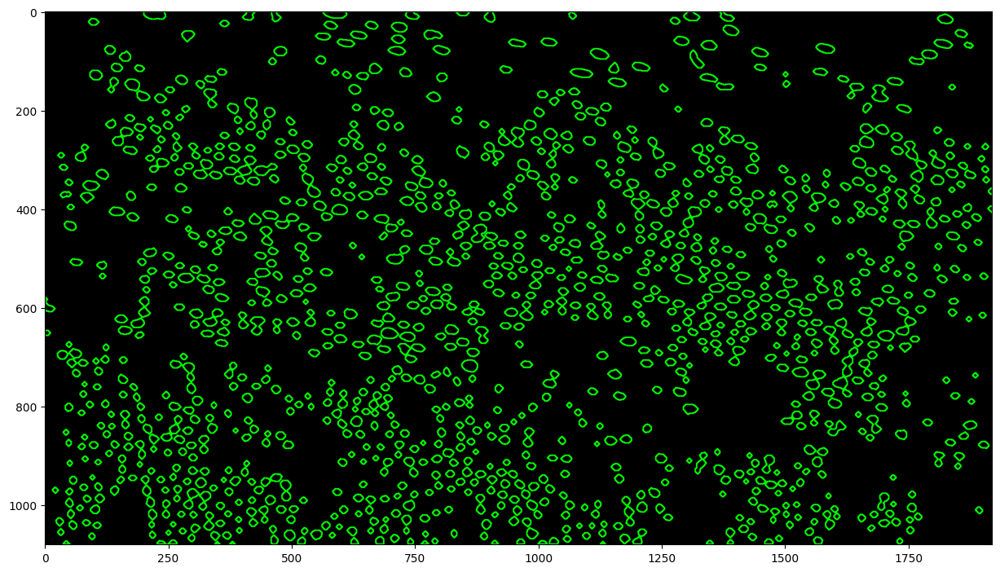

In [392]:
contours_fibers_lenght = [len(c) for c in contours_fibers]

cfl_mean = np.mean(contours_fibers_lenght)
cfl_std = np.std(contours_fibers_lenght)

print(cfl_mean)
print(cfl_std)

plt.hist(contours_fibers_lenght, bins=100)
plt.show()

contours_fibers_filtered = [c for c in contours_fibers if len(c) < cfl_mean + 1*cfl_std]

img_contornos_3 = cv2.drawContours(np.zeros((dim[0],dim[1],3)), contours_fibers_filtered, -1, (0,255,0), 2)
img_contornos_3 = np.uint8(img_contornos_3)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(img_contornos_3,vmin=0,vmax=255)
plt.show()

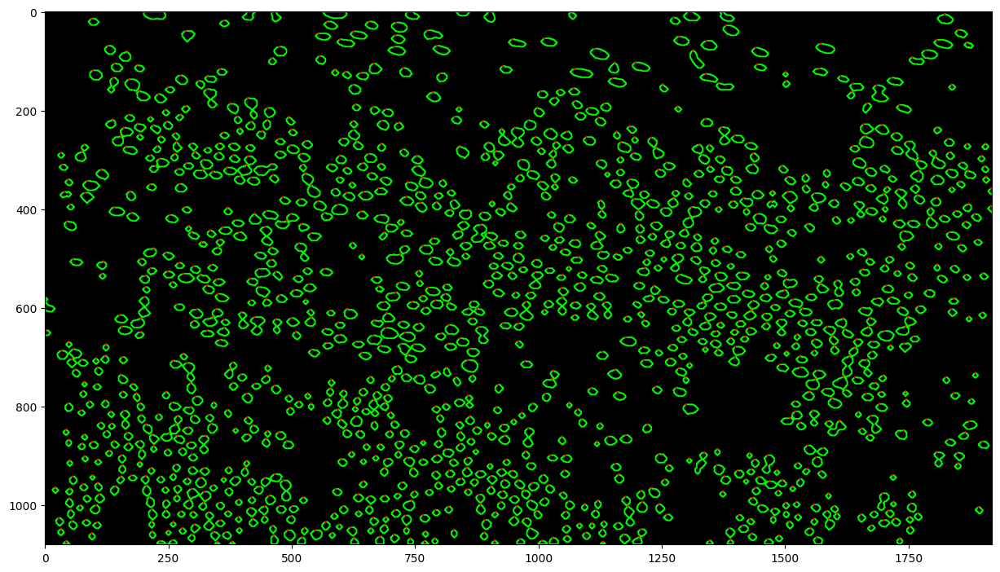

In [393]:
first_element_of_contours_2 = np.array([np.uint32(contours_fibers_filtered[i][0][0]) for i in range(len(contours_fibers_filtered))])
img_points_2 = img_contornos_3.copy()

for p in first_element_of_contours_2:
    cv2.circle(img_points_2, (p[0],p[1]), 2, (255,0,0), -1)


fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(img_points_2,vmin=0,vmax=255)
plt.show()

[(1074, 1130), (1074, 379)]


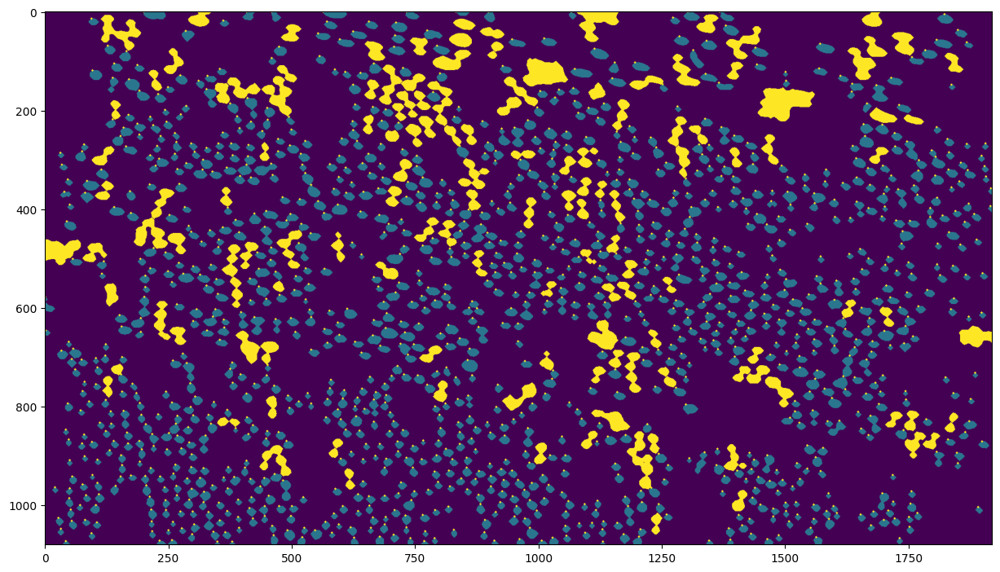

In [394]:
list_coordinates_2 = [(np.uint16(p[1]),np.uint16(p[0])) for p in first_element_of_contours_2]
print(list_coordinates_2[0:2])

test_9 = test_8.copy()
test_9[test_9 != 0] = 255

list_masks_2 = []

for coordinate in list_coordinates_2:
    mask = flood(test_9, coordinate, tolerance=1)
    list_masks_2.append(mask)
    test_9[mask] = 100

for p in first_element_of_contours_2:
    cv2.circle(test_9, (p[0],p[1]), 2, (255,0,0), -1)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(1, 1, 1)
ax.imshow(test_9,vmin=0,vmax=255)
plt.show()

In [395]:
# first_element_of_contours_2_filtered = np.array([np.uint32(contornos_2_filtered[i][0][0]) for i in range(len(contornos_2_filtered))])
# img_points_2 = img_contornos_2_filtered.copy()

# # for p in first_element_of_contours_2_filtered:
# #     cv2.circle(img_points_2, (p[0],p[1]), 5, (255,0,0), -1)

# centroids = []
# for c in contornos_2_filtered:
#    # calculate moments for each contour
#    M = cv2.moments(c)
 
#    # calculate x,y coordinate of center
#    cX = int(M["m10"] / M["m00"])
#    cY = int(M["m01"] / M["m00"])
#    cv2.circle(img_points_2, (cX,cY), 3, (255,0,0), -1)
#    centroids.append((cY,cX))



# fig = plt.figure(figsize=(15,15))
# ax = fig.add_subplot(1, 1, 1)
# ax.imshow(img_points_2,vmin=0,vmax=255)
# plt.show()